# Deadline
Presentation in front of the rest of the class: March 21th from 12:30  
Deadline: April 4th at 23:59

## Wandb login

In [1]:
import wandb

api_key_file = "/home/dreezy/.config/wandb/api_key"
with open(api_key_file, "r") as f:
    api_key = f.read().strip()

wandb.login(key=api_key, relogin=True)

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/dreezy/.netrc


True

## Download the dataset

In [2]:
import kagglehub

# Download latest version
data_path = kagglehub.dataset_download("kritikseth/fruit-and-vegetable-image-recognition")

print("Path to dataset files:", data_path)

/nix/store/8362gjd197z75dp9ibfc5yily5r78h3z-python3.11-tqdm-4.66.5/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Path to dataset files: /home/dreezy/.cache/kagglehub/datasets/kritikseth/fruit-and-vegetable-image-recognition/versions/8


# Option 1 (Vision)
## 1) Explore the dataset through code
### a) How many images does the dataset contain?

In [3]:
import os

n_images = 0
for split in os.listdir(data_path):
    split_path = os.path.join(data_path, split)
    for cls in os.listdir(split_path):
        class_path = os.path.join(data_path, split, cls)
        n_images += len(os.listdir(class_path))

print(f"Total images of dataset: {n_images}")
    

Total images of dataset: 3825


### b) How many classes? How many images per class? Show a histogram of the number of instances per class

In [4]:
data_dict = {}

verbose = False
for split in os.listdir(data_path):
    split_path = os.path.join(data_path, split)
    classes = os.listdir(split_path)
    if verbose: print(f"Total classes in {split}: {len(classes)}")
    
    split_dict = {}
    for idx, cls in enumerate(classes):
        class_path = os.path.join(data_path, split, cls)
        class_images = os.listdir(class_path)
        if verbose: print(f" -- Total images in {split}/{cls}: {len(class_images)}")
        #split_hist[idx] = len(class_images)
        split_dict[cls] = len(class_images)
    
    data_dict[split] = split_dict
    
    if verbose: print()

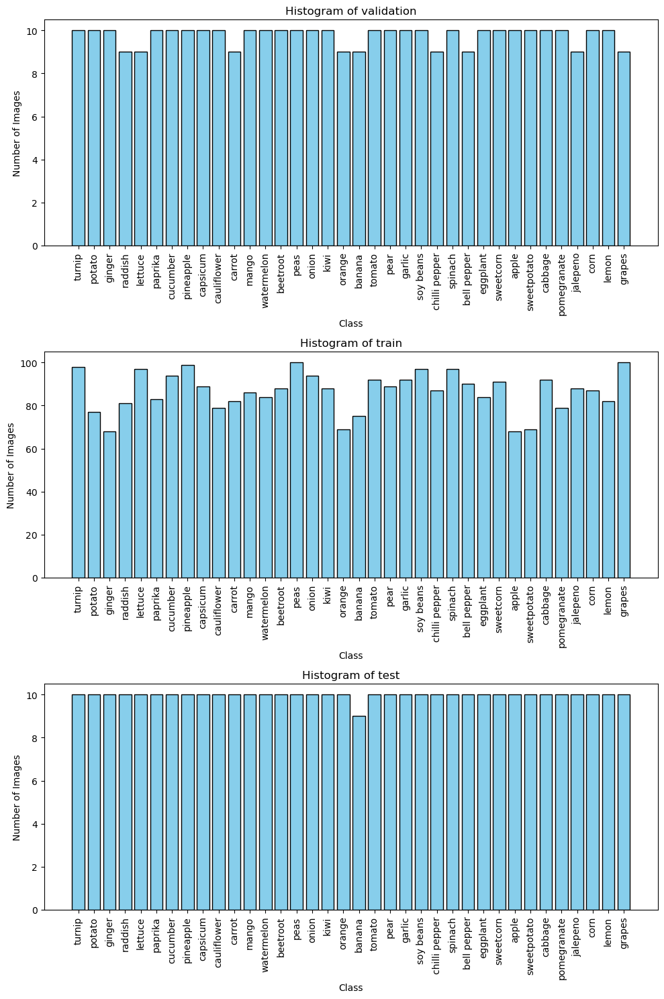

In [5]:
# Plot histograms for each split
import matplotlib.pyplot as plt
fig, axes = plt.subplots(len(data_dict), 1, figsize=(10, 5 * len(data_dict)), squeeze=False)

for i, (split, class_counts) in enumerate(data_dict.items()):
    class_names = list(class_counts.keys())
    image_counts = list(class_counts.values())

    axes[i, 0].bar(class_names, image_counts, color="skyblue", edgecolor="black")
    axes[i, 0].set_title(f"Histogram of {split}")
    axes[i, 0].set_xlabel("Class")
    axes[i, 0].set_ylabel("Number of Images")
    axes[i, 0].tick_params(axis="x", rotation=90)  # Rotate labels for readability

plt.tight_layout()
plt.show()

### c) Show 4 random images from each class

Class: turnip


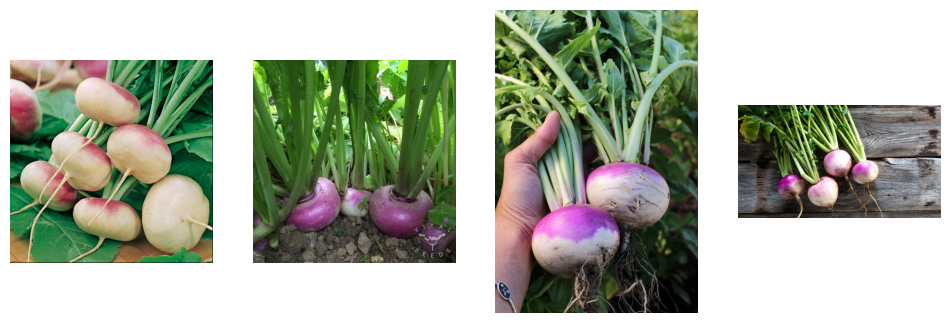

Class: potato


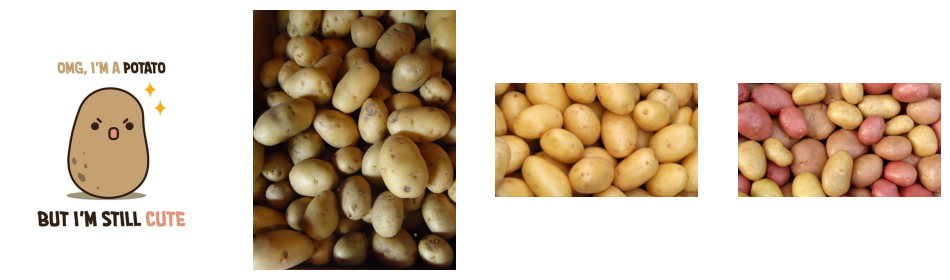

Class: ginger


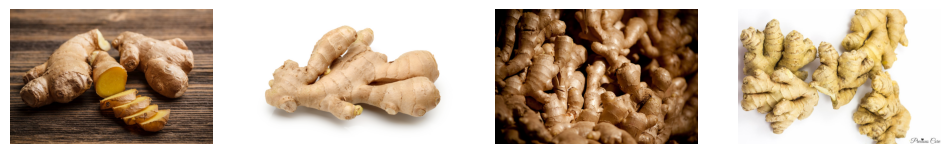

Class: raddish


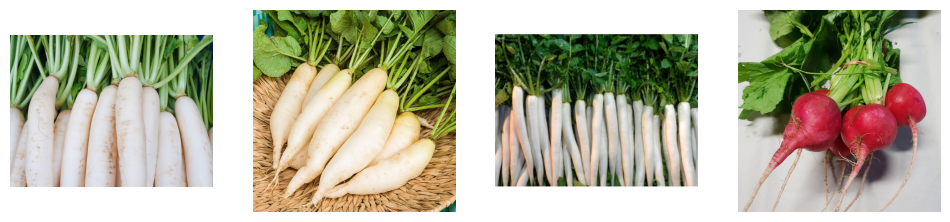

Class: lettuce


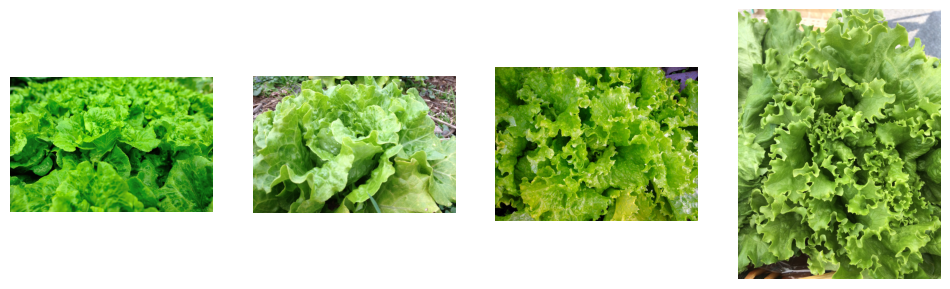

Class: paprika


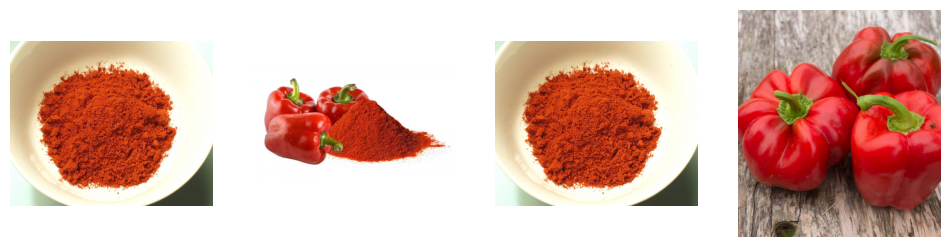

Class: cucumber


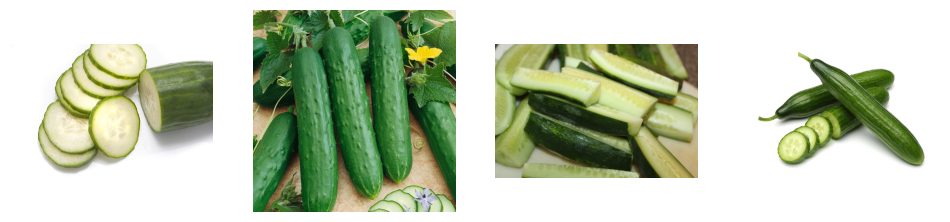

Class: pineapple


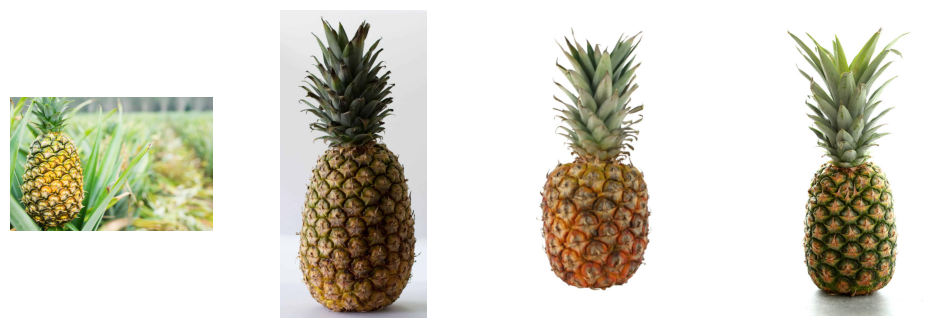

Class: capsicum


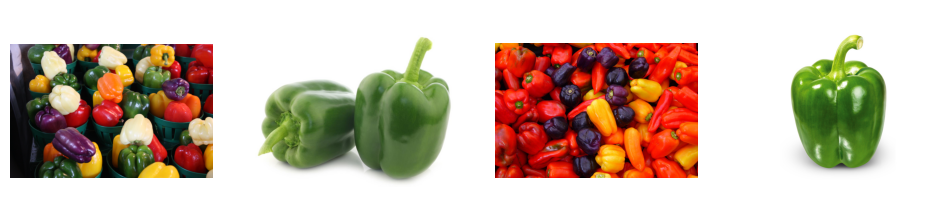

Class: cauliflower


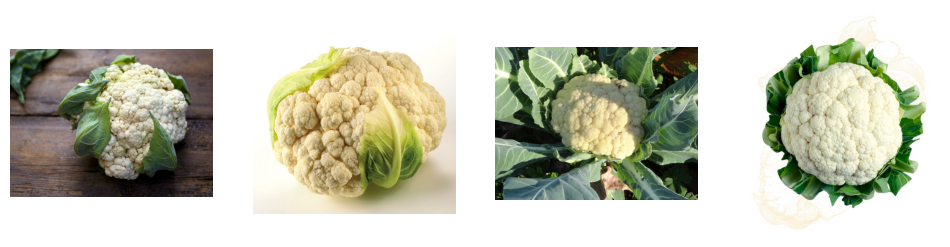

Class: carrot


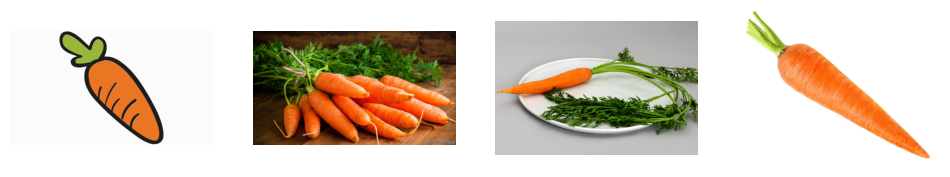

Class: mango


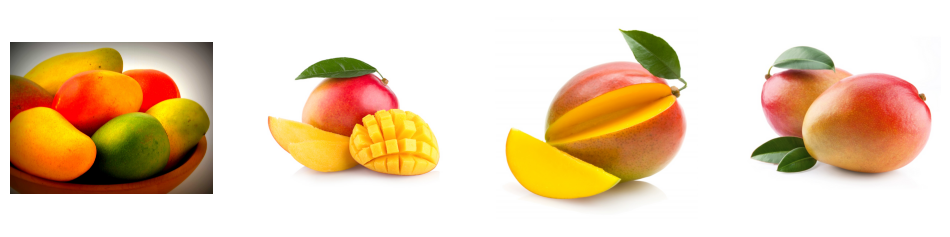

Class: watermelon


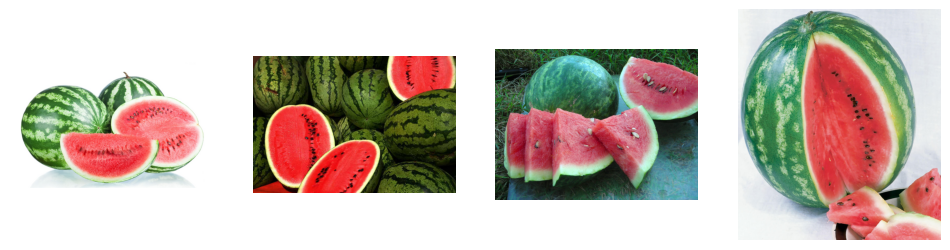

Class: beetroot


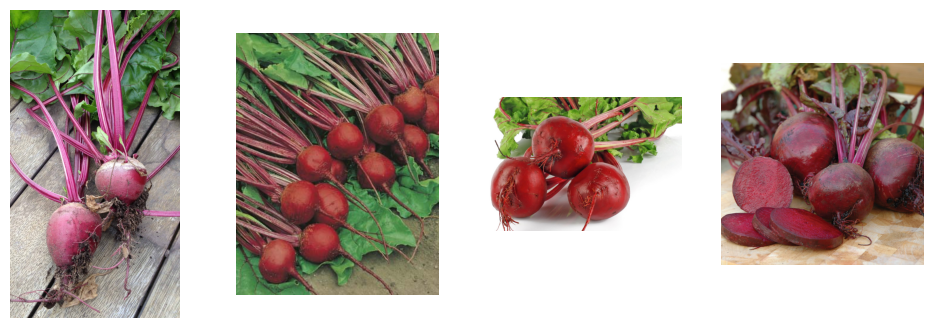

Class: peas


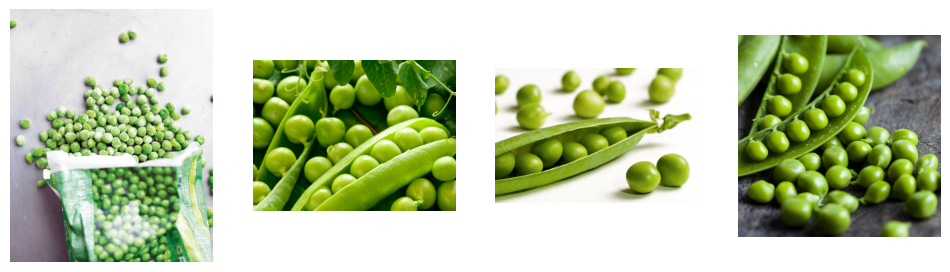

Class: onion


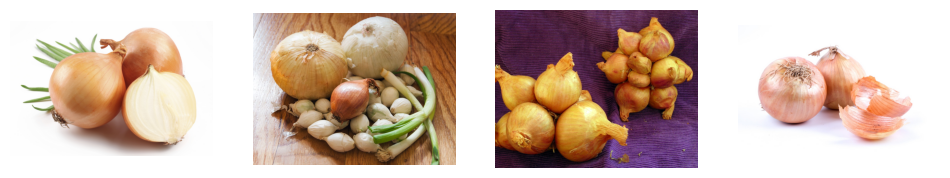

Class: kiwi


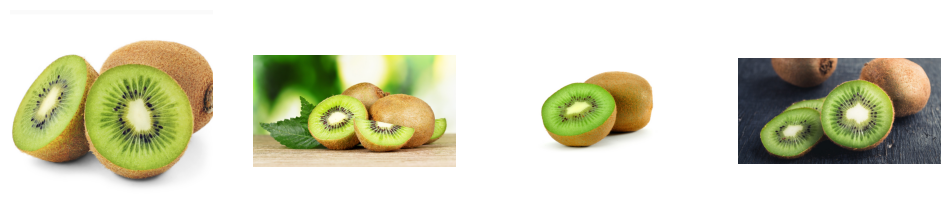

Class: orange


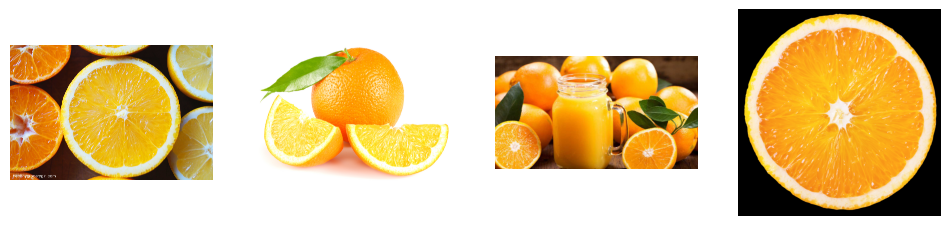

Class: banana


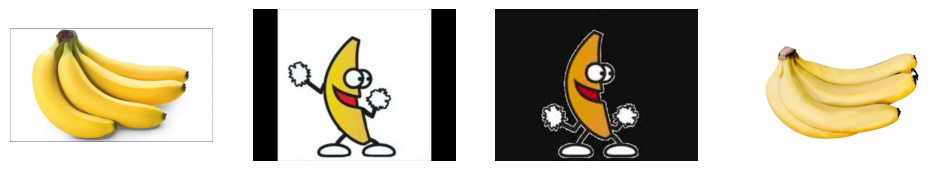

Class: tomato


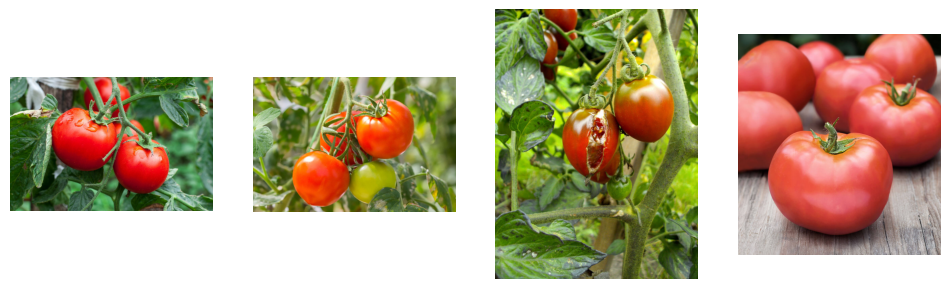

Class: pear


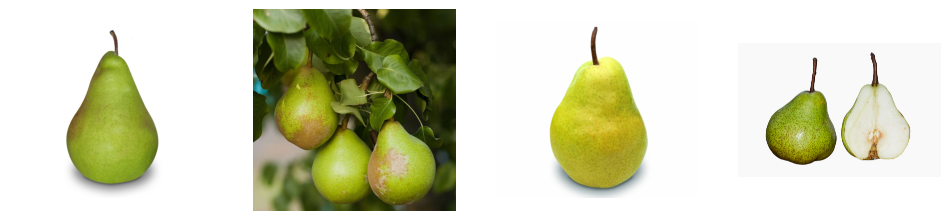

Class: garlic


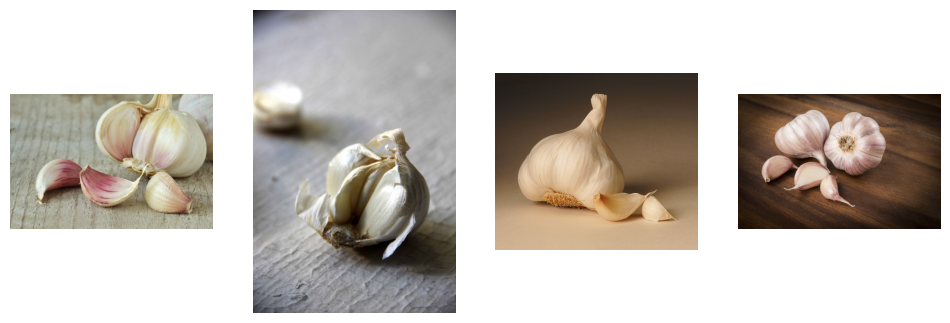

Class: soy beans


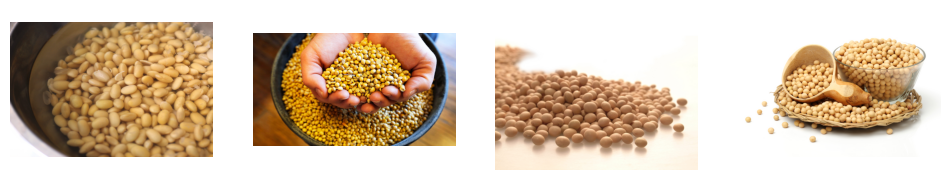

Class: chilli pepper


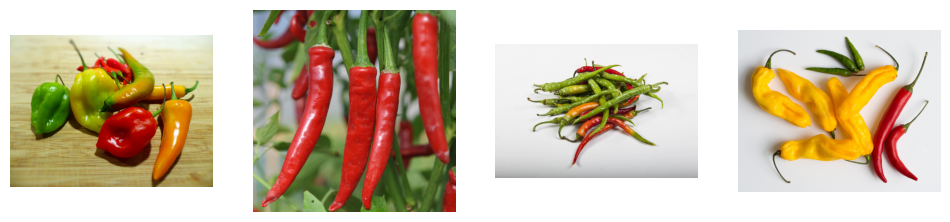

Class: spinach


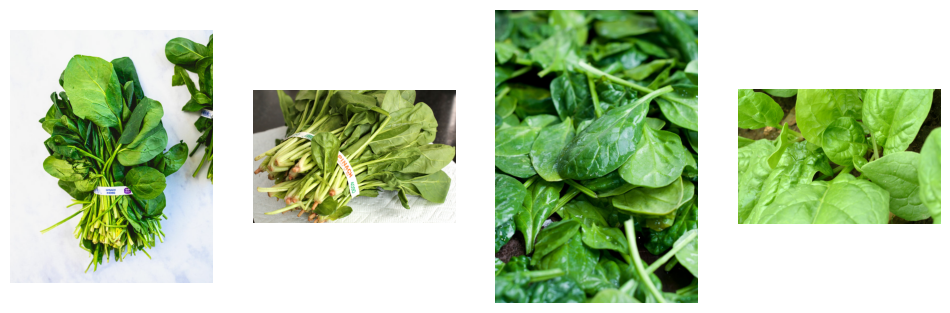

Class: bell pepper


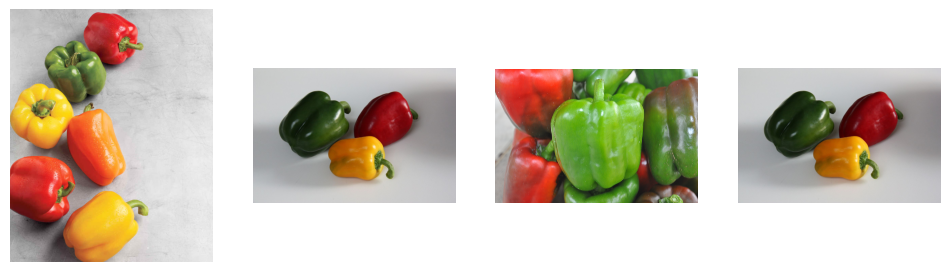

Class: eggplant


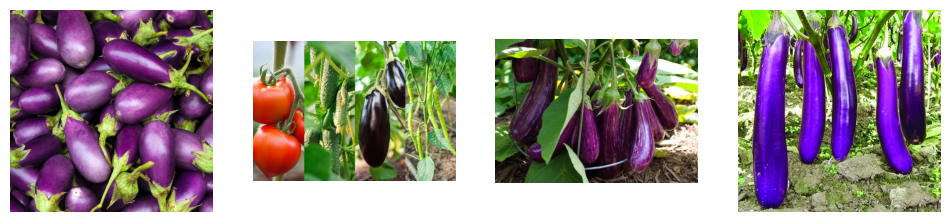

Class: sweetcorn


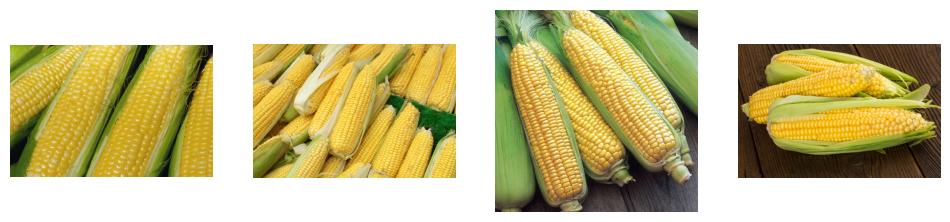

Class: apple


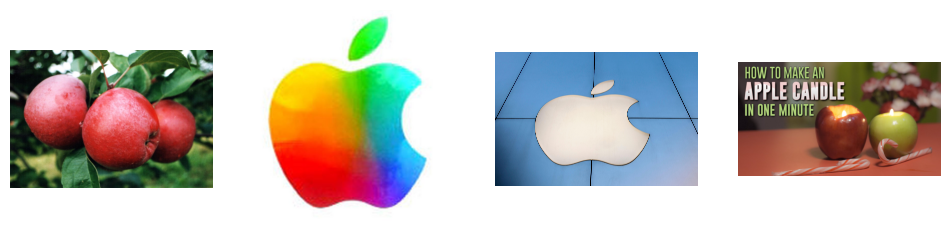

Class: sweetpotato


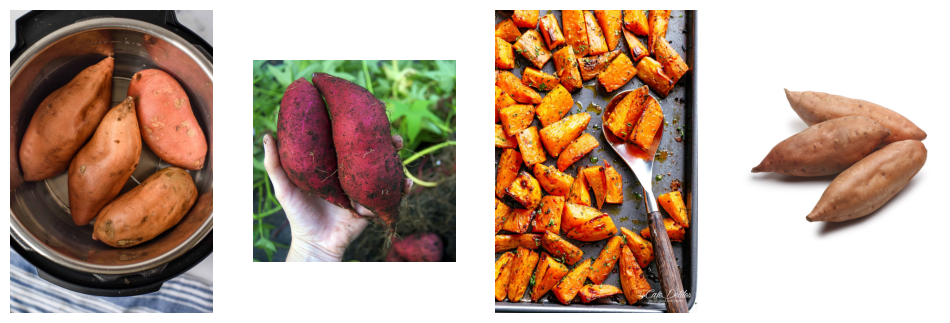

Class: cabbage


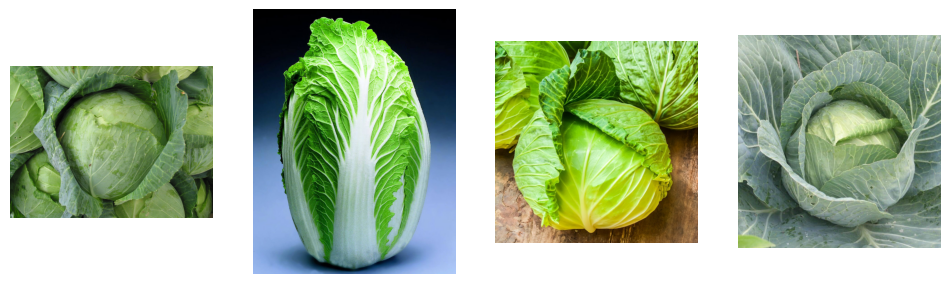

Class: pomegranate


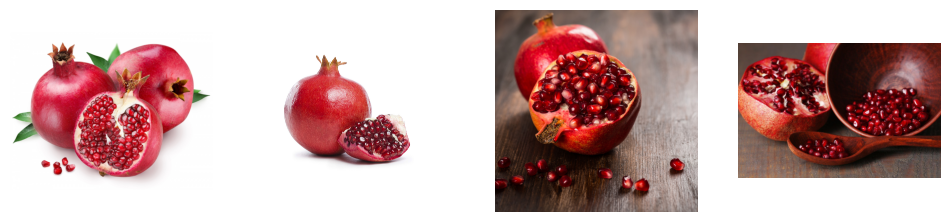

Class: jalepeno


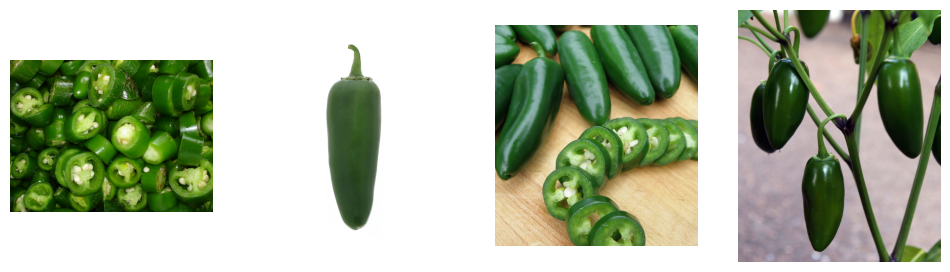

Class: corn


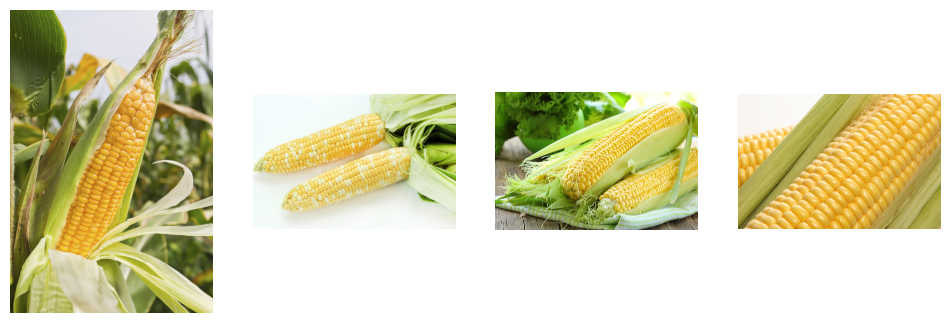

Class: lemon


libpng warning: iCCP: known incorrect sRGB profile


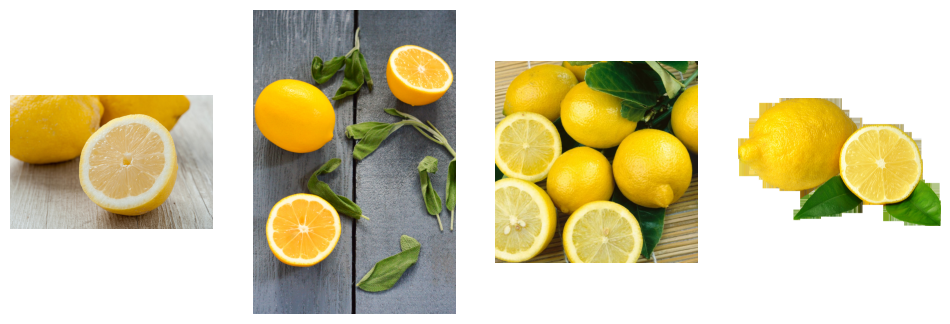

Class: grapes


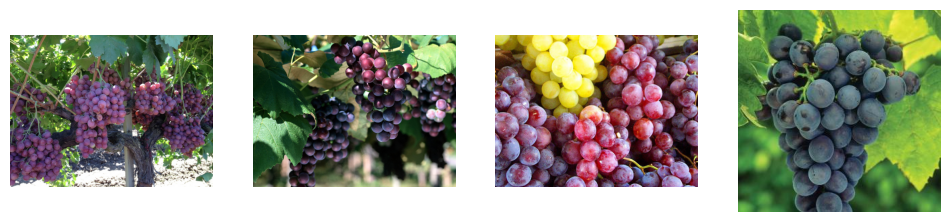

In [7]:
import random
import matplotlib.pyplot as plt
import cv2
from pathlib import Path

test_images = Path(data_path) / "test"

for class_folder in test_images.iterdir():
    image_files = list(class_folder.glob("*.*"))

    selected_images = random.sample(image_files, 4)  # Select 4 random images
    
    # Display images
    print(f"Class: {class_folder.name}")
    fig, axes = plt.subplots(1, len(selected_images), figsize=(12, 4))
    for img_path, ax in zip(selected_images, axes):
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img)
        ax.axis("off")
        
    plt.show()

### d) Describe if/how you think the data distribution will affect training of a classifier.

A model might overfit to classes with higher representation in the training data. This means that we may get more false positives for those classes and fewer true positives for the rest of the classes. To mitigate this, data balancing can be done with eg. augmented data or training on a subset of the available data though this may introduce other problems.

### e) Decide what part of the dataset to use; all, some classes, some samples. Motivate your choice.

As stated in d) we could benefit from choosing a subset of the available data. However, it is important to have representation from all classes that we want to be able to classify with our model. More data is also preferable as the model will be more generalized.

## 2) Use a neural network of your own choice to classify the dataset. Explain your choice and at least one alternative. Document your experiences:

In [ ]:
from torch import optim, nn, utils, Tensor
from torchvision.transforms import transforms
from torchvision.models import vision_transformer
import pytorch_lightning as PL
from pytorch_lightning.loggers import WandbLogger

model = vision_transformer.vit_b_16(weights=vision_transformer.ViT_B_16_Weights.IMAGENET1K_SWAG_E2E_V1)

vision_transformer.ViT_B_16_Weights.IMAGENET1K_SWAG_E2E_V1.transforms


#vision_transformer.vit_h_14(weights=vision_transformer.ViT_H_14_Weights.IMAGENET1K_SWAG_E2E_V1)



functools.partial(<class 'torchvision.transforms._presets.ImageClassification'>, crop_size=384, resize_size=384, interpolation=<InterpolationMode.BICUBIC: 'bicubic'>)

In [ ]:
from 

In [ ]:
class ViT_lightning(PL.LightningModule):
    def __init__(self, model, num_classes, lr=1e-3):
        super().__init__()
        self.model = model
        self.num_classes = num_classes
        self.loss_fn = nn.CrossEntropyLoss()
        self.accuracy = 0.0
        self.lr = lr

    def forward(self, x):
        return self.model(x)
    
    def configure_optimizers(self):
        #optimizer = optim.Adam(self.parameters(), lr=self.lr, betas=(0.9, 0.999), weight_decay=0.1)
        optimizer = optim.AdamW(self.parameters(), lr=self.lr, betas=(0.9, 0.999), weight_decay=0.1)
        return optimizer

    def training_step(self, train_batch, batch_idx):
        x, y = train_batch
        preds = self(x)
        loss = self.loss_fn(preds, y)
        self.log("train_loss", loss, prog_bar=True,)# on_step=True, on_epoch=False)
        return loss

    def validation_step(self, val_batch, batch_idx):
        x, y = val_batch
        preds = self(x)
        loss = self.loss_fn(preds, y)
        acc = (preds.argmax(dim=1) == y).float().mean()
        self.log("val_loss", loss, prog_bar=True)
        self.log("val_acc", acc, prog_bar=True)

# Trainer
wandb_logger = WandbLogger(log_model="all")
trainer = PL.Trainer(logger=wandb_logger, max_epochs=10, accelerator="gpu", devices=1, precision=16)

### a) Discuss at least four relevant hyper-parameters

- Learning rate

### b) Experiment with the effect of different batch sizes

### c) Experiment with the effect of different learning rates

### d) Experiment with different number of network layers

### e) Implement at least two data augmentation techniques. Motivate your choices.

RandomRotate
RandomZoom
RandomFlip
Salt&PepperNoise
RandomScale

### f) Discuss what influences the memory use of a solution such as yours. What can be done to reduce this?

There are several factors that influence the memory of our solution. The first, and most obvious, is the batch size. A higher batch size means we need to fit more images in memory. Another factor is the model itself. It is imperative that the model/weights can fit in memory along with the images in a batch. A third factor that affects the memory usage of our solution is the data type. In our solution we used the default floating-point data type for torch (torch.float32). We could have used torch.float16 or a larger data type which would influence the memory usage.

So, in summary, we can reduce memory usage using one or more of the following methods:
1. Decrease batch size
2. Decrease model parameters
3. Use torch.float16 precision



### g) Make sure to distribute the experiments between group members. Include a plot in the report that shows user id vs. e.g. performance metric. To do this, make sure that a user id is logged as one of the parameters to wandb.

## 3) Break down the results of your classifier. Some suggestions:

### a) Which classes are easy and which are hard? Discuss why.

### b) Show five examples where the classification went well, and five where the classification failed. What could be some reasons that classification failed and what can be done to improve?